In [79]:
import numpy as np
import pandas as pd
import math
from earthscopestraintools.mseed_tools import ts_from_mseed
from earthscopestraintools.gtsm_metadata import GtsmMetadata
from earthscopestraintools.timeseries import Timeseries
from earthscopestraintools.event import Earthquake
from earthscopestraintools.event_processing import calc_hypocentral_dist, magnitude_plot, plot_coseismic_offset
from datetime import datetime, timedelta

import logging
logger = logging.getLogger()
logging.basicConfig(
        format="%(message)s", level=logging.INFO
    )


In [113]:
network = 'PB'
station = 'B935'
meta = GtsmMetadata(network,station)

In [114]:
eq = Earthquake(event_id = "us7000nw7b")
hypocentral_distance = calc_hypocentral_dist(eq.lat,
                                                 eq.long,
                                                 eq.depth,
                                                 meta.latitude,
                                                 meta.longitude)
print(f"USGS Magnitude {eq.mag} at {hypocentral_distance} km at {eq.time}")
meta.get_event_terms()

USGS Magnitude 7 at 123 km at 2024-12-05 18:44:21.110000+00:00


PB B935 Loading T0 BS* from 2024-12-05T18:44:06 to 2024-12-05T18:45:21 from Earthscope DMC miniseed
    Trace 1. 2024-12-05T18:44:06.000000Z:2024-12-05T18:45:21.000000Z mapping BS1 to CH0
    Trace 2. 2024-12-05T18:44:06.000000Z:2024-12-05T18:45:21.000000Z mapping BS2 to CH1
    Trace 3. 2024-12-05T18:44:06.000000Z:2024-12-05T18:45:21.000000Z mapping BS3 to CH2
    Trace 4. 2024-12-05T18:44:06.000000Z:2024-12-05T18:45:21.000000Z mapping BS4 to CH3
    Found 0 epochs with nans, 7.5 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.5%
  Converting 999999 gap fill values to nan
    Found 7 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.47%
PB.B935.T0.BS*
    | Channels: ['CH0', 'CH1', 'CH2', 'CH3']             
    | TimeRange: 2024-12-05 18:44:06 - 2024-12-05 18:45:21        | Period:          0.05s
    | Series:         raw| Units:        counts| Level:          0| Gaps:            0.47% 
    | Epochs:        1501| Good:

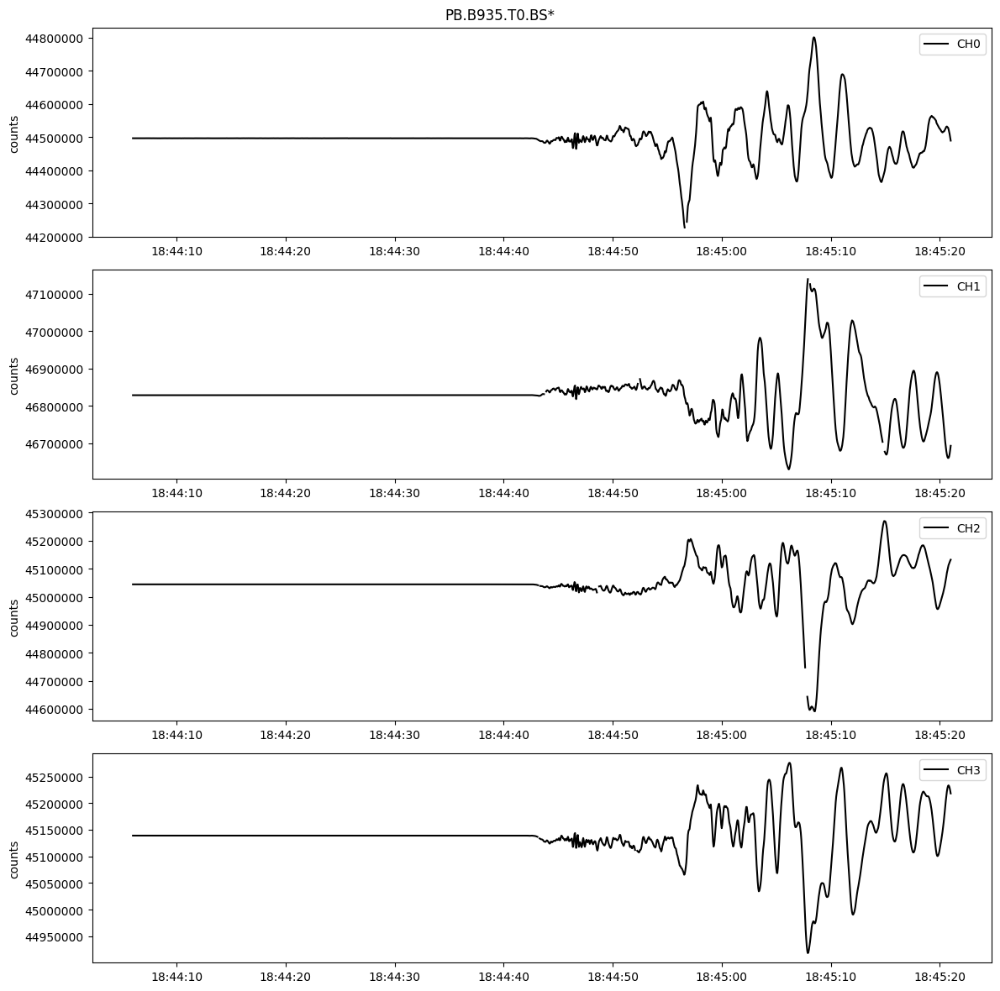

In [115]:
start = (eq.time - timedelta(seconds=15)).strftime("%Y-%m-%dT%H:%M:%S")
end = (eq.time + timedelta(seconds=60)).strftime("%Y-%m-%dT%H:%M:%S")
strain_raw = ts_from_mseed(network=network, station=station, location='T0', channel='BS*', start=start, end=end)
strain_raw.stats()
strain_raw.plot(type='line')

In [130]:
gauge_microstrain = strain_raw.linearize(reference_strains=meta.reference_strains, gap=meta.gap)
gauge_microstrain.stats()

gauge_microstrain_interpolated = gauge_microstrain.interpolate(method='linear', limit_seconds=3600)
gauge_microstrain_interpolated.stats()

Converting raw counts to microstrain
    Found 7 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.47%
PB.B935.T0.BS*.linearized
    | Channels: ['CH0', 'CH1', 'CH2', 'CH3']             
    | TimeRange: 2024-12-05 18:44:06 - 2024-12-05 18:45:21        | Period:          0.05s
    | Series: microstrain| Units:   microstrain| Level:          1| Gaps:            0.47% 
    | Epochs:        1501| Good:         1493.5| Missing:      7.5| Interpolated:      0.0
    | Samples:       6004| Good:           5974| Missing:       30| Interpolated:        0
Interpolating data using method=linear and limit=72000
    Found 0 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.0%
PB.B935.T0.BS*.linearized.interpolated
    | Channels: ['CH0', 'CH1', 'CH2', 'CH3']             
    | TimeRange: 2024-12-05 18:44:06 - 2024-12-05 18:45:21        | Period:          0.05s
    | Series: microstrain| Units:   microstrain| Level

Applying Butterworth Filter
    Found 0 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.0%
PB.B935.T0.BS*.linearized.interpolated.filtered
    | Channels: ['CH0', 'CH1', 'CH2', 'CH3']             
    | TimeRange: 2024-12-05 18:44:06 - 2024-12-05 18:45:21        | Period:          0.05s
    | Series:            | Units:   microstrain| Level:          1| Gaps:             0.0% 
    | Epochs:        1501| Good:         1493.5| Missing:      0.0| Interpolated:      7.5
    | Samples:       6004| Good:           5974| Missing:        0| Interpolated:       30


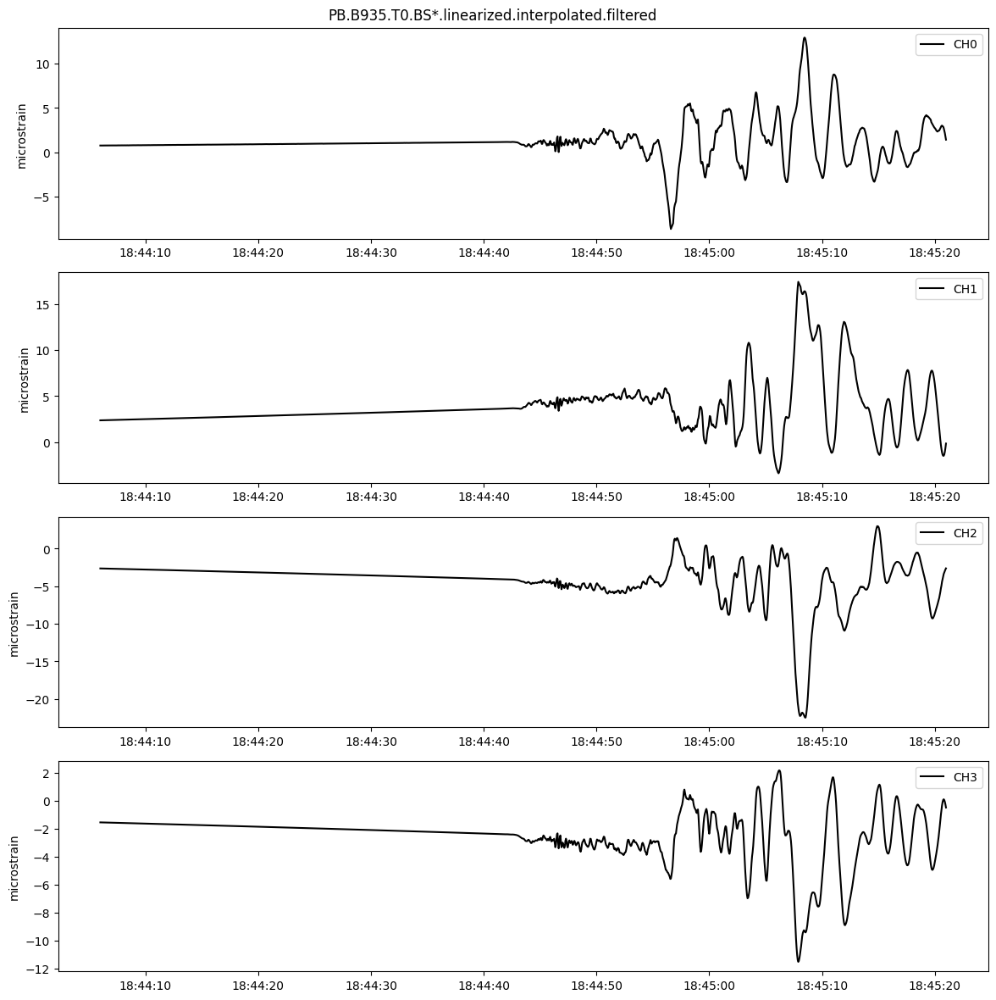

In [131]:
gauge_microstrain_filtered = gauge_microstrain_interpolated.butterworth_filter(filter_type='high', filter_order=2, filter_cutoff_s=1000)
gauge_microstrain_filtered.stats()
gauge_microstrain_filtered.plot(type='line')

Calculating dynamic strain using gauge weights: [1, 1, 1, 1]
    Found 0 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.0%
PB.B935.T0.BS*.linearized.interpolated.filtered.dynamic
    | Channels: ['dynamic']                              
    | TimeRange: 2024-12-05 18:44:06 - 2024-12-05 18:45:21        | Period:          0.05s
    | Series:     dynamic| Units:   microstrain| Level:          1| Gaps:             0.0% 
    | Epochs:        1501| Good:         1473.0| Missing:      0.0| Interpolated:     28.0
    | Samples:       1501| Good:           1473| Missing:        0| Interpolated:       28


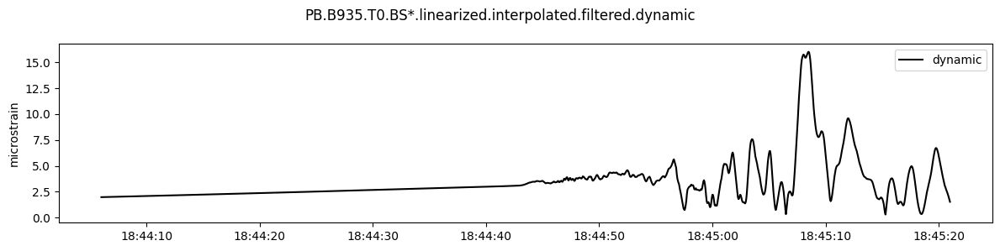

In [132]:
dynamic_strain = gauge_microstrain_filtered.dynamic_strain()
dynamic_strain.stats()
dynamic_strain.plot(type='line')

Calculating magnitude from dynamic strain using site term -0.1081 and longitude term 0
    Found 0 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.0%


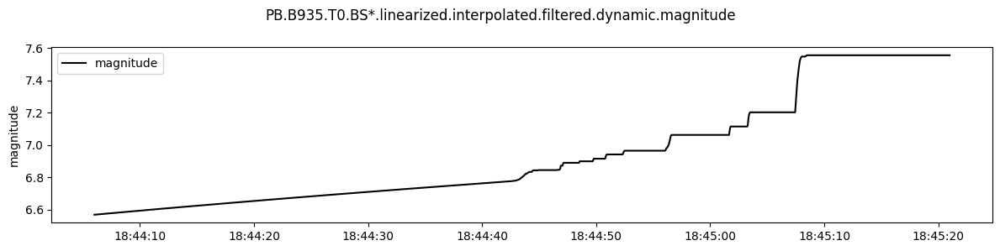

In [133]:
estimated_magnitude = dynamic_strain.calculate_magnitude(hypocentral_distance, meta.site_term, meta.longitude_term)
estimated_magnitude.plot()

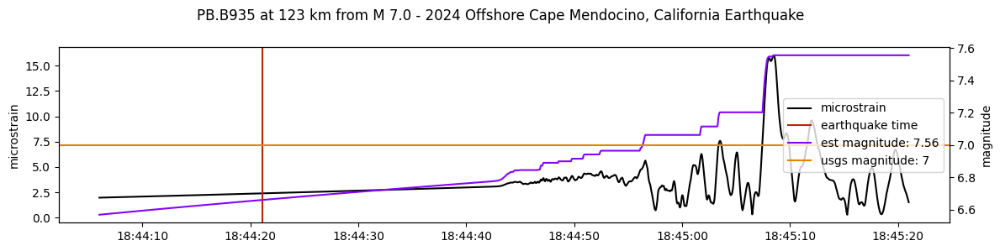

In [134]:
title = f"{network}.{station} at {hypocentral_distance} km from {eq.name}"
magnitude_plot(dynamic_strain_df=dynamic_strain.data,
               magnitude_df=estimated_magnitude.data,
               eq_time=eq.time,
               eq_mag=eq.mag,
               title=title)

Applying None matrix:
 [[ 0.921  1.1    1.027  0.357]
 [ 0.395 -0.498 -0.275  0.253]
 [ 0.329 -0.204 -0.903 -0.093]]
    Found 0 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.0%


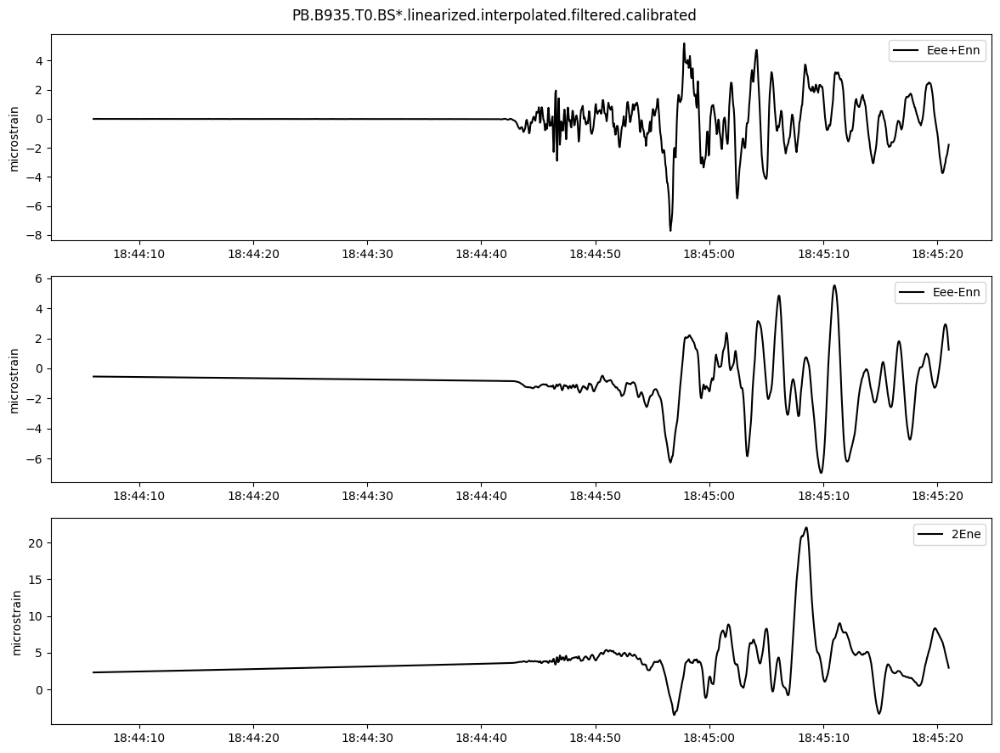

In [135]:
regional_microstrain = gauge_microstrain_filtered.apply_calibration_matrix(meta.strain_matrices['KH2013'])
regional_microstrain.plot()

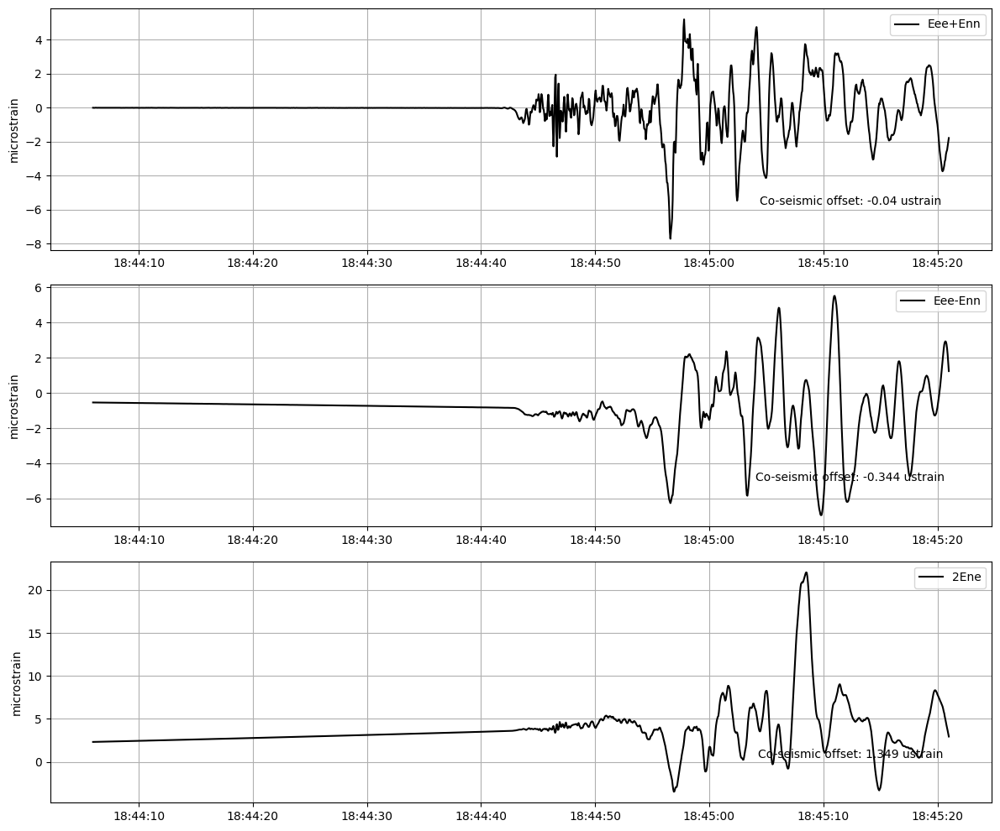

In [136]:
plot_coseismic_offset(
    df = regional_microstrain.data,
    plot_type='line',
    units = 'microstrain',
    eq_time= eq.time,
    coseismic_offset = True,
    color="black",)

In [137]:
from earthscopestraintools.strain_visualization import strain_video

In [138]:
regional_microstrain.data

,Eee+Enn,Eee-Enn,2Ene
time,,,
2024-12-05 18:44:06.000,-0.012352,-0.540172,2.316799
2024-12-05 18:44:06.050,-0.015895,-0.542129,2.317053
2024-12-05 18:44:06.100,-0.018445,-0.543575,2.317691
2024-12-05 18:44:06.150,-0.014284,-0.542122,2.320688
2024-12-05 18:44:06.200,-0.012248,-0.541740,2.322947
...,...,...,...
2024-12-05 18:45:20.800,-2.594908,2.766970,4.247958
2024-12-05 18:45:20.850,-2.499908,2.521288,3.951593
2024-12-05 18:45:20.900,-2.273893,2.170855,3.617824


In [139]:
meta.strain_matrices['KH2013']

array([[ 0.921,  1.1  ,  1.027,  0.357],
       [ 0.395, -0.498, -0.275,  0.253],
       [ 0.329, -0.204, -0.903, -0.093]])

In [140]:
# Calculate Azimuth
from obspy.geodetics import gps2dist_azimuth
dist, az, _ = gps2dist_azimuth(eq.lat,eq.long,meta.latitude,meta.longitude)

In [127]:
regional_microstrain.data['Eee+Enn_org'] = regional_microstrain.data['Eee+Enn']
regional_microstrain.data['Eee+Enn'] = np.ones(len(regional_microstrain.data))

In [128]:
meta.station

'B935'

Animation.save using <class 'matplotlib.animation.PillowWriter'>


Saving Figure: /Users/chanagan/Downloads/B045M7Mendocino20241205.gif


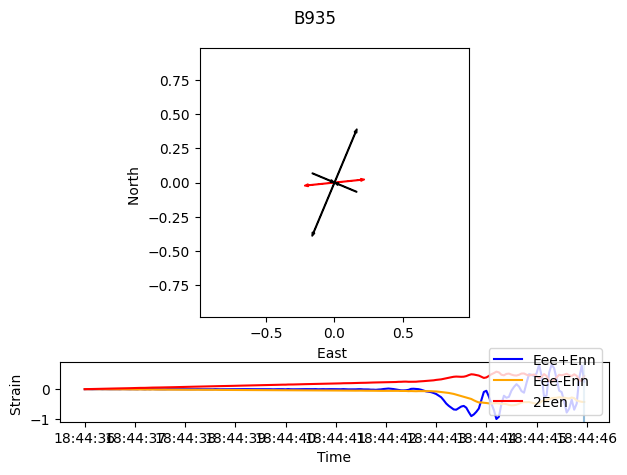

Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [141]:
strain_video(regional_microstrain.data,azimuth_arrow=az, start='2024-12-05T18:44:36',end='2024-12-05T18:44:45',skip=1, repeat=True,
             title=meta.station,savegif='/Users/chanagan/Downloads/B045M7Mendocino20241205.gif')


In [112]:
regional_microstrain.data

,Eee+Enn,Eee-Enn,2Ene,Eee+Enn_org
time,,,,
2024-12-05 18:44:06.000,1.0,-0.263428,-2.713182,11.984701
2024-12-05 18:44:06.050,1.0,-0.263502,-2.715134,11.990715
2024-12-05 18:44:06.100,1.0,-0.263579,-2.717049,11.996699
2024-12-05 18:44:06.150,1.0,-0.263720,-2.718980,12.002767
2024-12-05 18:44:06.200,1.0,-0.263745,-2.721001,12.009106
...,...,...,...,...
2024-12-05 18:45:20.800,1.0,1.427238,-0.129192,1.645984
2024-12-05 18:45:20.850,1.0,1.320173,-0.140540,1.573074
2024-12-05 18:45:20.900,1.0,1.141603,-0.145141,1.523974


In [75]:
ea1, ed1, es1 = regional_microstrain.data.iloc[0:100].mean()
ea2, ed2, es2 = regional_microstrain.data.iloc[-100:].mean()
ea, ed, es = ea2-ea1, ed2-ed1, es2-es1
print(ea, ed, es), np.array(ea)

4.198760984994935 -0.8005273148724112 -0.4958703801842871


(None, array(4.19876098))

In [76]:
np.array([ea])

array([4.19876098])

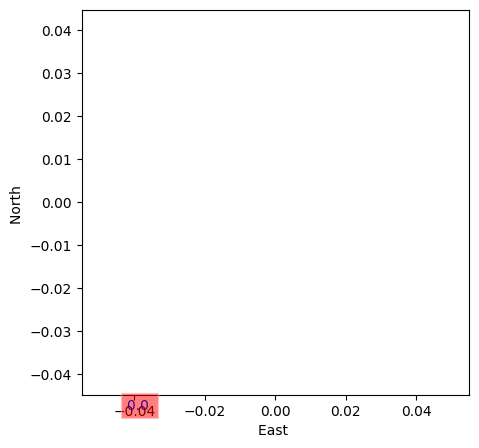

In [78]:
from earthscopestraintools.strain_visualization import map_strain
import numpy as np
# Array of offsets to plot in areal, differential, and shear strains

# Colors for each set of axes
colors = ['lightblue','orange','maroon']
# labeels for each set of arrows
station_list = ['lightblue','orange','maroon']
# call the function
map_strain(areal=np.array([ea])*1000,differential=np.array([ed])*1000,shear=np.array([es])*1000,lats=np.array([35]),lons=np.array([-118]))

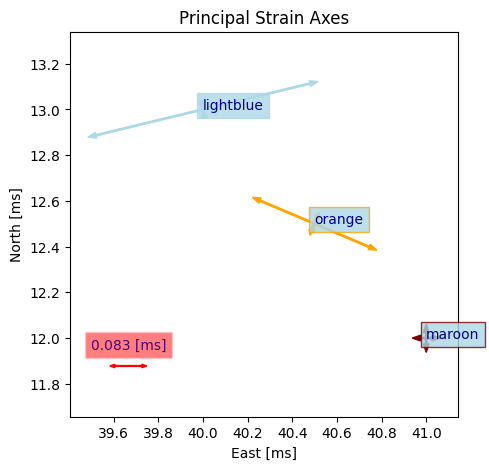

In [72]:
from earthscopestraintools.strain_visualization import map_strain
import numpy as np
# Array of offsets to plot in areal, differential, and shear strains
ea = np.array([1,0.5,0.25])*10
ed = np.array([1,0.5,0])*10
es = np.array([0.5,-0.5,0])*10
# Colors for each set of axes
colors = ['lightblue','orange','maroon']
# labeels for each set of arrows
station_list = ['lightblue','orange','maroon']
# location informtion
lats, lons = np.array([13,12.5,12.0]), np.array([40,40.5,41])
# call the function
map_strain(areal=ea,differential=ed,shear=es,
           lats=lats, lons=lons,station_list=station_list,
           colors=colors,units='ms',title='Principal Strain Axes')